# masking

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from plantclef.spark import get_spark

spark = get_spark(
    cores=6,
    memory="100g",
)
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/03/01 17:08:05 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/03/01 17:08:05 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).


In [3]:
import os
from pathlib import Path

# Get list of stored filed in cloud bucket
root = Path(os.path.expanduser("~"))
! date

Sat Mar  1 05:08:07 PM EST 2025


In [4]:
# Path and dataset names
scratch_data_path = f"{root}/scratch/plantclef/data/"
project_data_path = f"{root}/shared/plantclef/data"

# Define the path to the train and test parquet files
mask_path = f"{project_data_path}/masking/test_2024_dev_dk"
test_path = f"{project_data_path}/parquet/test_2024"

# Read the parquet files into a spark DataFrame
mask_df = spark.read.parquet(mask_path)
test_df = spark.read.parquet(test_path)

# Show the data
mask_df.printSchema()
mask_df.show(vertical=True, truncate=100, n=1)
test_df.printSchema()
test_df.show(n=5)

root
 |-- image_name: string (nullable = true)
 |-- leaf_mask: binary (nullable = true)
 |-- flower_mask: binary (nullable = true)
 |-- plant_mask: binary (nullable = true)
 |-- sand_mask: binary (nullable = true)
 |-- wood_mask: binary (nullable = true)
 |-- tape_mask: binary (nullable = true)
 |-- rock_mask: binary (nullable = true)
 |-- snow_mask: binary (nullable = true)
 |-- gravel_mask: binary (nullable = true)
 |-- sample_id: integer (nullable = true)



-RECORD 0-----------------------------------------------------------------------------------------------------------
 image_name  | CBN-PdlC-B4-20190722.jpg                                                                             
 leaf_mask   | [78 9C EC D8 BD AE 65 D9 55 86 E1 EE 94 AB A8 AC 40 EA 00 6C 8B 80 0B 20 03 91 10 10 A1 16 6E 44 ... 
 flower_mask | [78 9C EC DD B1 B2 2C CB 95 D7 61 C9 E5 29 E4 09 22 64 C0 CC 04 06 0F 80 07 81 83 81 45 28 18 11 ... 
 plant_mask  | [78 9C EC DD C1 92 2D CB 75 D7 61 DD 29 4F A1 99 20 C2 03 B0 1D 0C 78 00 66 10 4C 18 30 22 1C 58 ... 
 sand_mask   | [78 9C EC DD BD 8E 65 57 11 06 D0 E9 94 A7 E8 AC 41 9A 00 6C 8B 80 07 20 03 91 10 10 A1 11 1E 44 ... 
 wood_mask   | [78 9C EC DD B1 B2 2C CB 95 D7 61 C9 E5 29 E4 09 22 64 C0 CC 04 06 0F 80 07 81 83 81 45 28 18 11 ... 
 tape_mask   | [78 9C EC DA BF AE 1D D5 1D 86 61 4F 9B AB 38 DD 49 24 17 04 50 8A 5C 40 3A 10 4D 8A 54 91 05 8E ... 
 rock_mask   | [78 9C EC D9 BF AE 2C EB 7A D5 E1 73 52 AE E2 64 

+--------------------+--------------------+--------------------+
|          image_name|                path|                data|
+--------------------+--------------------+--------------------+
|CBN-PdlC-C6-20130...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-Pla-D3-201508...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-C3-20190...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-C1-20200...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-B2-20160...|/test_2024/images...|[FF D8 FF E0 00 1...|
+--------------------+--------------------+--------------------+
only showing top 5 rows



In [5]:
# count number of rows
mask_df.count(), test_df.count()

(1695, 1695)

In [6]:
# Collect binary image data from DataFrame
rows, cols = 3, 3
subset_df = test_df.limit(rows * cols).cache()
mask_subset_df = subset_df.join(mask_df, "image_name")
mask_subset_df.show(vertical=True, truncate=50, n=1)

-RECORD 0---------------------------------------------------------
 image_name  | CBN-PdlC-A3-20180815.jpg                           
 path        | /test_2024/images/CBN-PdlC-A3-20180815.jpg         
 data        | [FF D8 FF E0 00 10 4A 46 49 46 00 01 01 01 00 4... 
 leaf_mask   | [78 9C EC DD B1 8E 24 59 5A 86 E1 2C 97 AB 68 A... 
 flower_mask | [78 9C EC DD C1 8E A5 4B 76 15 E0 CA 29 4F D1 B... 
 plant_mask  | [78 9C EC DD C1 8E A5 4B 76 15 E0 CA 29 4F D1 B... 
 sand_mask   | [78 9C EC DD C1 AE A4 4D 76 1D D6 BA 53 3F 45 C... 
 wood_mask   | [78 9C EC DD C1 8E A5 4B 76 15 E0 CA 29 4F D1 B... 
 tape_mask   | [78 9C EC DB B1 8A 64 45 14 80 E1 7B 53 9F A2 B... 
 rock_mask   | [78 9C EC D6 BF CE 6D 59 7A D5 E1 EA 94 AB A8 A... 
 snow_mask   | [78 9C EC DD C1 AE A4 4D 76 1D D6 BA 53 3F 45 C... 
 gravel_mask | [78 9C EC DD C1 AE A4 4D 76 1D D6 BA 53 3F 45 C... 
 sample_id   | 5                                                  
only showing top 1 row



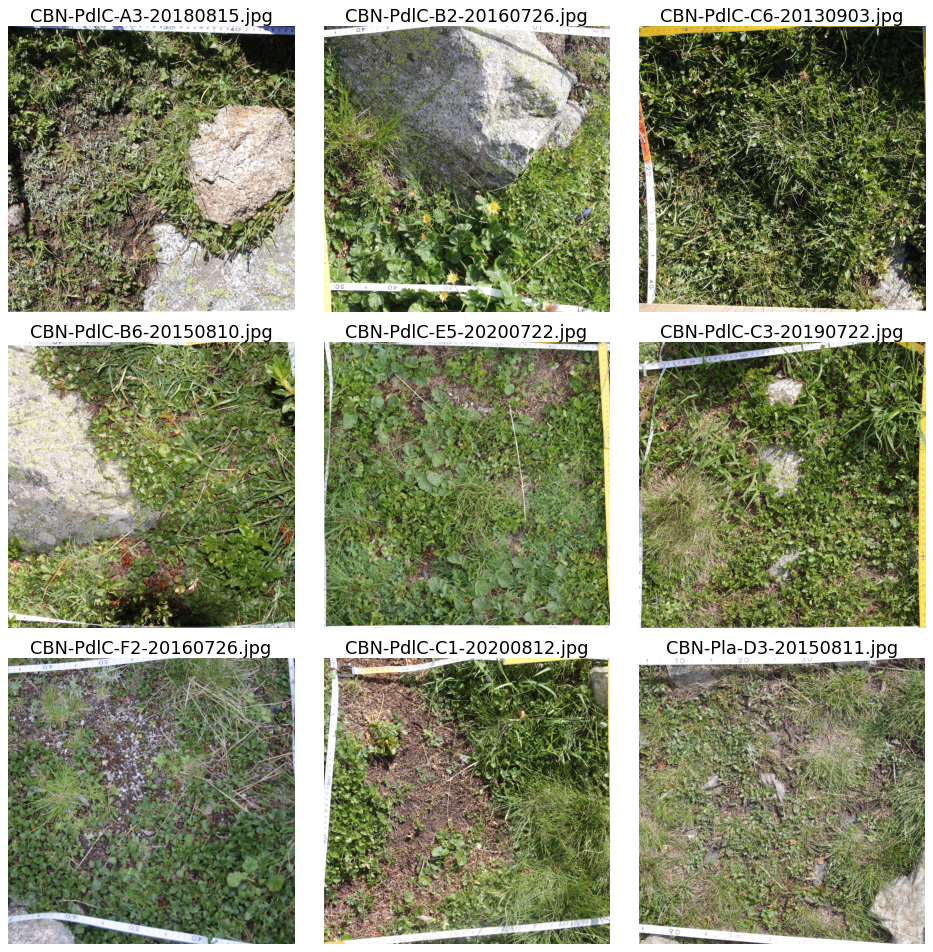

In [7]:
from plantclef.plotting import plot_images_from_binary

# Display the images in a grid with names
plot_images_from_binary(
    mask_subset_df,
    data_col="data",
    label_col="image_name",
    grid_size=(3, 3),
    crop_square=True,
)

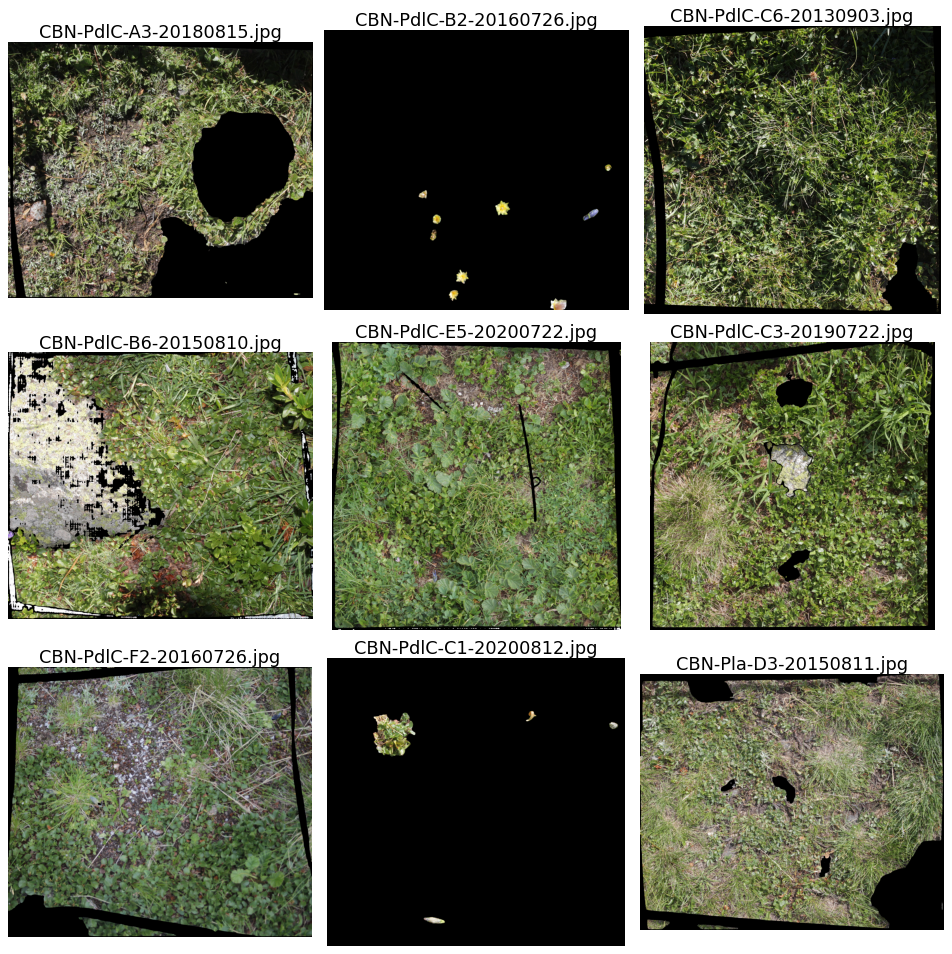

In [8]:
from plantclef.plotting import plot_masks_from_binary

# Display the images in a grid with names
plot_masks_from_binary(
    mask_subset_df,
    image_data_col="data",
    mask_data_col="flower_mask",
    label_col="image_name",
    grid_size=(3, 3),
    crop_square=True,
)

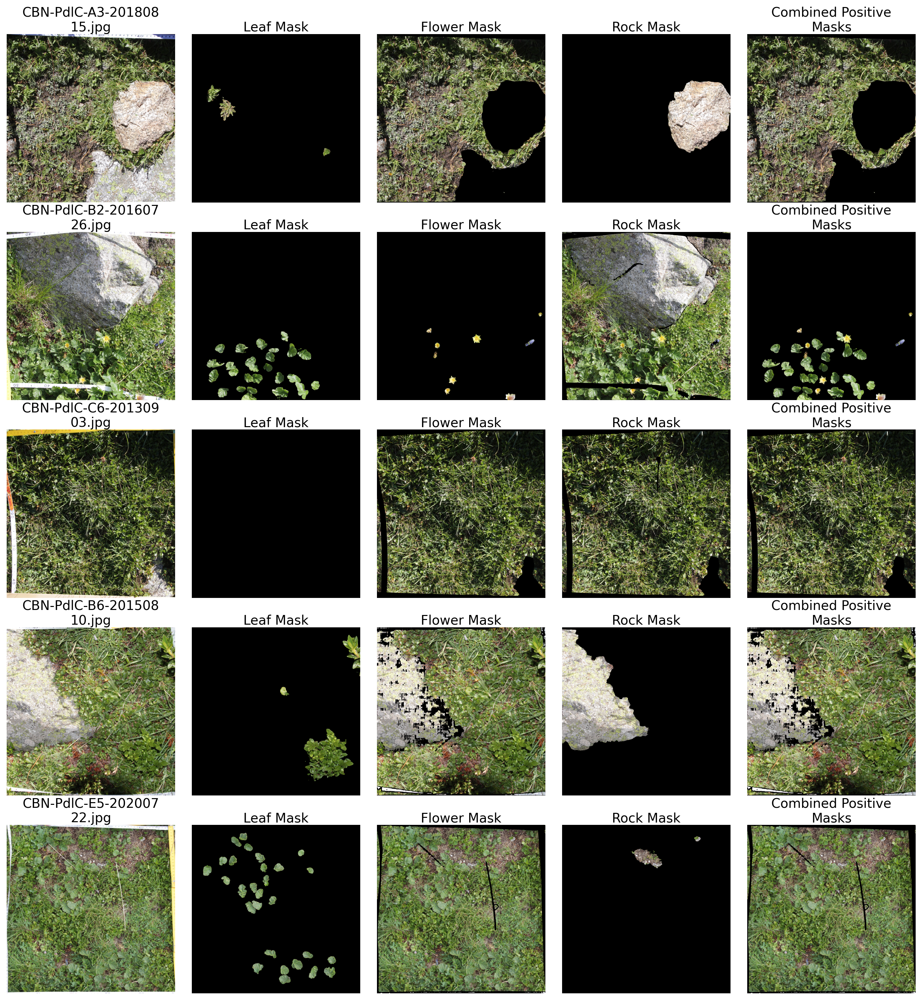

In [9]:
# masks we want to display
from plantclef.plotting import plot_individual_masks_comparison

mask_names = ["leaf_mask", "flower_mask", "rock_mask"]


# row = mask_subset_df.first()
# display(
#     (type(row.flower_mask), len(row.flower_mask), len(zlib.compress(row.flower_mask)))
# )
# #image = deserialize_image(row["data"]).convert("RGB")
# #image_array = np.array(image)

# Load masks
# masks = {mask_name: np.load(row.flower_mask) for mask_name in mask_names}


plot_individual_masks_comparison(
    mask_subset_df,
    mask_names=mask_names,
    label_col="image_name",
    num_rows=5,
    figsize=(14, 15),
    fontsize=14,
    wrap_width=18,
    crop_square=True,
    dpi=200,
)

### interesting test images

In [10]:
# interesting test images
images = [
    "CBN-Pyr-03-20230706.jpg",
    # "OPTMix-012-P2-207-20231201.jpg",
    "OPTMix-0178-P1-661-20231006.jpg",
    # "OPTMix-0333-P2-115-20231212.jpg",
    # "OPTMix-0598-P4-104-20231207.jpg",
    # "RNNB-1-4-20240117.jpg",
    # "RNNB-1-7-20230512.jpg",
    # "RNNB-1-8-20230512.jpg",
    # "RNNB-4-2-20240118.jpg",
    "RNNB-8-8-20240118.jpg",
    "CBN-can-E6-20230706.jpg",
    "CBN-Pla-A3-20140812.jpg",
]

In [11]:
from pyspark.sql import functions as F

# get subset of images
selected_df = test_df.where(F.col("image_name").isin(images)).cache()
selected_mask_df = mask_df.join(selected_df, "image_name")
selected_mask_df.show(vertical=True, truncate=50, n=1)

-RECORD 0---------------------------------------------------------
 image_name  | OPTMix-0178-P1-661-20231006.jpg                    
 leaf_mask   | [78 9C EC DD CD 8E 2D CB 92 E0 F5 CC 29 4F 71 6... 
 flower_mask | [78 9C ED DB C1 8E 6D CD 61 96 E1 FC 53 AE C2 3... 
 plant_mask  | [78 9C EC DD CD 8E 25 CD 92 A8 E5 CC 29 57 D1 B... 
 sand_mask   | [78 9C ED DD BB 92 24 CB 96 98 E7 2C 15 4F 71 B... 
 wood_mask   | [78 9C EC DD BB 92 65 CD 72 D8 F7 DD 2E 9F E2 7... 
 tape_mask   | [78 9C ED C8 31 0E 01 41 00 85 E1 D5 3A C5 74 4... 
 rock_mask   | [78 9C ED DD BB CE 26 CB 93 2F E4 5E 2E 57 31 D... 
 snow_mask   | [78 9C ED DD BD 92 24 CD B6 26 E4 2A 95 AB 38 D... 
 gravel_mask | [78 9C ED DD BB 92 24 CB 96 98 E7 2C 15 4F 71 B... 
 sample_id   | 14                                                 
 path        | /test_2024/images/OPTMix-0178-P1-661-20231006.jpg  
 data        | [FF D8 FF DB 00 43 00 06 04 05 06 05 04 06 06 0... 
only showing top 1 row



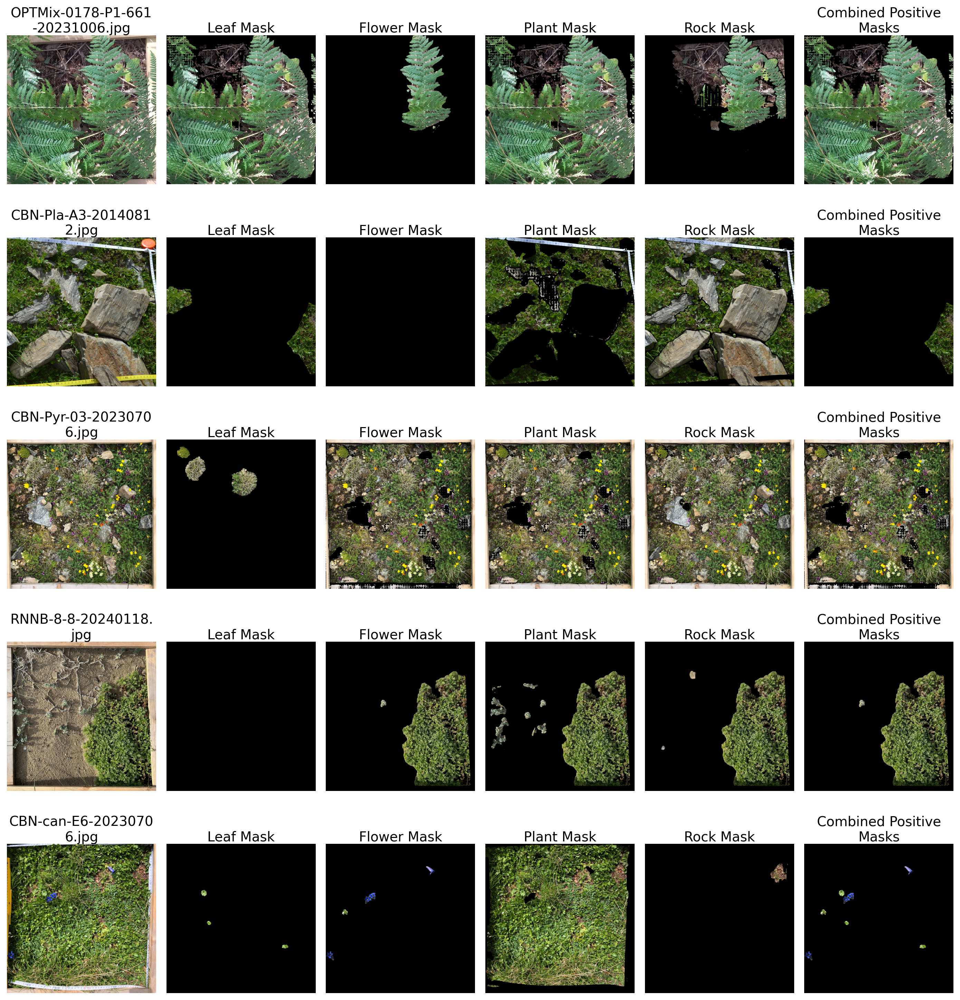

In [14]:
# masks we want to display
mask_names = ["leaf_mask", "flower_mask", "plant_mask", "rock_mask"]

plot_individual_masks_comparison(
    selected_mask_df,
    mask_names=mask_names,
    label_col="image_name",
    num_rows=5,
    figsize=(14, 15),
    fontsize=14,
    wrap_width=18,
    crop_square=True,
    dpi=200,
)

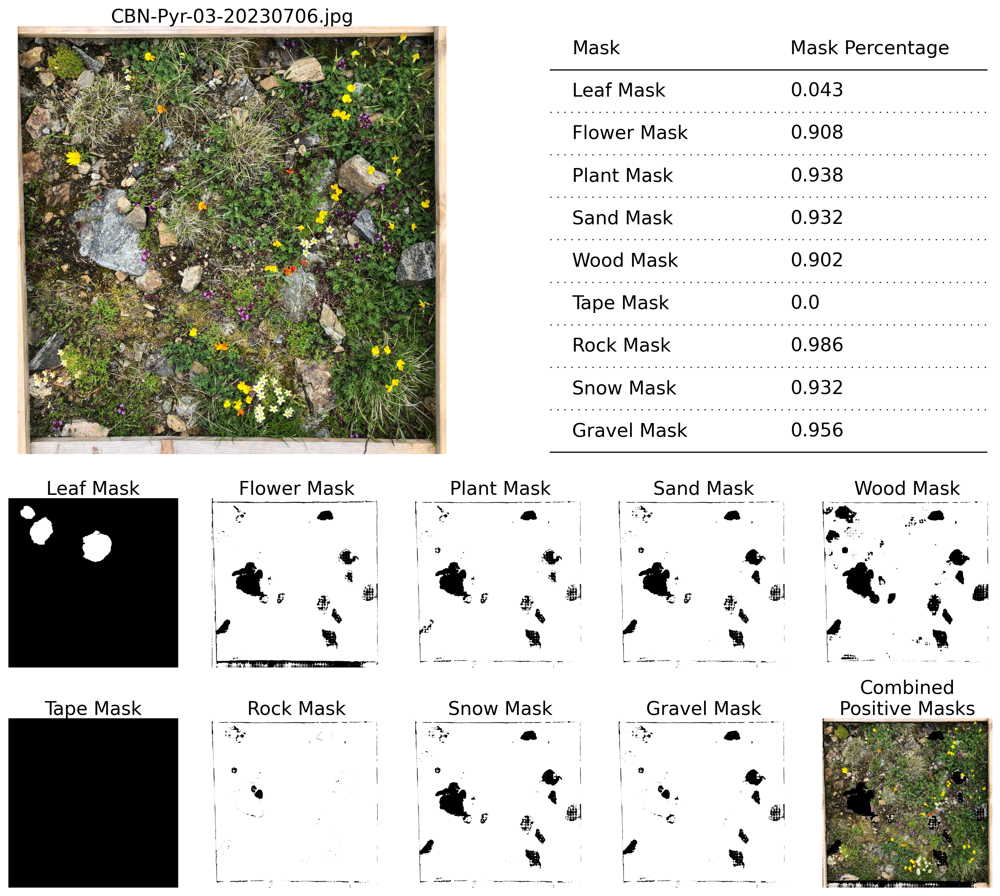

In [15]:
from plantclef.plotting import plot_mask_percentage

# plot Anthony's masking plot
plot_mask_percentage(
    selected_mask_df,
    image_name="CBN-Pyr-03-20230706.jpg",
    figsize=(12, 11),
    fontsize=16,
    dpi=200,
)